<a href="https://colab.research.google.com/github/ds-praveenkumar/Machine-Learning-Summits-20-NA/blob/main/TensorFlow2_101_Examples.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TensorFlow 2.0 : 101 - Lab

Accomodating the [TensorFlow 2.0 : 101](https://tiny.cc/tf2-101-preso) course

# Setup

In [ ]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

TensorFlow 2.x selected.


In [ ]:
import pathlib
from datetime import datetime
import timeit

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import PIL.Image as Image

from tensorflow.keras import layers
import tensorflow_hub as hub

np.set_printoptions(precision=4)

In [ ]:
%load_ext tensorboard

# Introduction

## Tensors

In [ ]:
print(tf.add(1, 2))
print(tf.add([1, 2], [3, 4]))
print(tf.square(5))
print(tf.reduce_sum([1, 2, 3]))
print(tf.square(2) + tf.square(3))

tf.Tensor(3, shape=(), dtype=int32)
tf.Tensor([4 6], shape=(2,), dtype=int32)
tf.Tensor(25, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(13, shape=(), dtype=int32)


In [ ]:
x = tf.add([[1]], [[2, 3]])
print(x)
print(x.shape)
print(x.dtype)

tf.Tensor([[3 4]], shape=(1, 2), dtype=int32)
(1, 2)
<dtype: 'int32'>


In [ ]:
a = tf.constant([[1.0, 2.0], [3.0, 4.0]])
b = tf.constant([[1.0, 1.0], [0.0, 1.0]])

In [ ]:
a.shape

TensorShape([2, 2])

In [ ]:
a

<tf.Tensor: id=22, shape=(2, 2), dtype=float32, numpy=
array([[1., 2.],
       [3., 4.]], dtype=float32)>

In [ ]:
tf.print(b)

[[1 1]
 [0 1]]


In [ ]:
mul = tf.matmul(a, b)
tf.print(mul)

[[1 3]
 [3 7]]


### Graph

In [ ]:
@tf.function
def linear_regression_step(x, y):
  W = tf.random.uniform([1, 2], -1.0, 1.0, name='weights')
  b = tf.zeros([1], name='biases')
  y_pred = tf.add(tf.multiply(W, x), b)
  loss = tf.reduce_mean(tf.square(y_pred - y))
  return y_pred, loss 

In [ ]:
# Graph setup
stamp = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = 'logs/func/%s' % stamp
writer = tf.summary.create_file_writer(logdir)

x = tf.constant([2.0, 1.0], name='inputs')
y = tf.constant([4.0], name='label')

with tf.name_scope('example_linreg') as scope:
  tf.summary.trace_on(graph=True, profiler=True)
  pred, loss = linear_regression_step(x, y)
  with writer.as_default():
    tf.summary.trace_export(
        name="linreg_trace",
        step=0,
        profiler_outdir=logdir)

In [ ]:
tf.print(pred) # for both samples
tf.print(loss)

[[0.803138494 -0.852571487]]
12.0138435


In [ ]:
%tensorboard --logdir logs/func

## Gradients

In [ ]:
x = tf.constant([2.0])
w = tf.constant([4.0])
b = tf.constant([1.0])

with tf.GradientTape() as t:
  t.watch(x)
  # y = f(x) = w*x + b
  y = tf.add(tf.multiply(x, w), b)

# dy_dx = f'(x) = w
dy_dx = t.gradient(y, x)

In [ ]:
tf.print(x)
tf.print(dy_dx)

[2]
[4]


## Quickstart #1 - MNIST

In [ ]:
# Load data
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

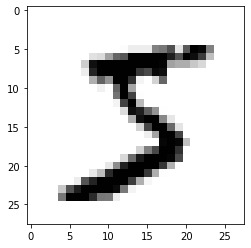

In [ ]:
plt.imshow(x_train[0], cmap='gray_r')

In [ ]:
# Define an image classification model with 10 classes
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Train
model.fit(x_train, y_train, epochs=5)

Train on 60000 samples
Epoch 1/5
60000/60000 [==============================] - 6s 102us/sample - loss: 0.2962 - accuracy: 0.9133
Epoch 2/5
60000/60000 [==============================] - 5s 87us/sample - loss: 0.1429 - accuracy: 0.9577
Epoch 3/5
60000/60000 [==============================] - 5s 86us/sample - loss: 0.1071 - accuracy: 0.9681
Epoch 4/5
60000/60000 [==============================] - 5s 87us/sample - loss: 0.0875 - accuracy: 0.9730
Epoch 5/5
60000/60000 [==============================] - 5s 88us/sample - loss: 0.0737 - accuracy: 0.9768


In [ ]:
# Evaluate
model.evaluate(x_test,  y_test, verbose=2)

10000/1 - 0s - loss: 0.0365 - accuracy: 0.9789


[0.07253941855735611, 0.9789]

[[1.2366e-07 2.0678e-09 6.9618e-06 2.8355e-04 7.0261e-12 4.9518e-07
  1.0292e-15 9.9971e-01 3.9526e-07 1.5559e-06]]
7


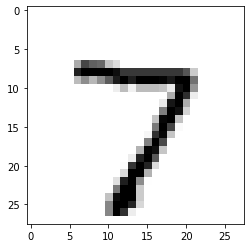

In [ ]:
prediction = model.predict(x_test[0:1]) # predict expects batches
print(prediction)
print(np.argmax(prediction))
plt.imshow(x_test[0], cmap='gray_r')

# TensorFlow 2.0

## TF 1.0 Hello World - Session

In [ ]:
## Wouldn't actually run in this TF2.0 notebook
# Create TensorFlow object called hello_constant
hello_constant = tf.constant('Hello World!')
with tf.Session() as sess:
    # Run the tf.constant operation in the session
    output = sess.run(hello_constant)
    print(output)

In [ ]:
## Even worse -
x = tf.placeholder(tf.string)
with tf.Session() as sess:
    output = sess.run(x, feed_dict={x: 'Hello World'})

## TF 2.0 Hello World - Eager

In [ ]:
print(tf.constant('Hello World!'))

tf.Tensor(b'Hello World!', shape=(), dtype=string)


## Functions

In [ ]:
@tf.function
def sum_even(items):
  s = 0
  # Traverse tesnors with a native for loop
  # (VS cumbersome tf.while_loop)
  for c in items:
    # Print c here? tf.print(c) - works, print(c) - ignored
    if c % 2 > 0:
      continue
    s += c
  return s

In [ ]:
tf.print(sum_even(tf.constant([10, 12, 15, 20])))

42


In [ ]:
# Want to see what AutoGraph translates your code to?
print(tf.autograph.to_code(sum_even.python_function))

def tf__sum_even(items):
  do_return = False
  retval_ = ag__.UndefinedReturnValue()
  with ag__.FunctionScope('sum_even', 'sum_even_scope', ag__.ConversionOptions(recursive=True, user_requested=True, optional_features=(), internal_convert_user_code=True)) as sum_even_scope:
    s = 0

    def get_state_2():
      return ()

    def set_state_2(_):
      pass

    def loop_body(iterates, s):
      c = iterates
      continue_ = False

      def get_state():
        return ()

      def set_state(_):
        pass

      def if_true():
        continue_ = True
        return continue_

      def if_false():
        return continue_
      cond = c % 2 > 0
      continue_ = ag__.if_stmt(cond, if_true, if_false, get_state, set_state, ('continue_',), ())

      def get_state_1():
        return ()

      def set_state_1(_):
        pass

      def if_true_1():
        s_1, = s,
        s_1 += c
        return s_1

      def if_false_1():
        return s
      cond_1 = ag__.not_(continue_)
 

### Tracing side effects

In [ ]:
@tf.function
def f(x):
  print("Traced with", x)
  tf.print("Executed with", x)

f(1)
f(1)
f(2)

Traced with 1
Executed with 1
Executed with 1
Traced with 2
Executed with 2


### Eager VS Graph timing

In [ ]:
lstm_cell = tf.keras.layers.LSTMCell(10)

@tf.function
def lstm_fn(input, state):
  return lstm_cell(input, state)

input = tf.zeros([10, 10])
state = [tf.zeros([10, 10])] * 2
# warm up
lstm_cell(input, state); lstm_fn(input, state)
print("eager lstm:", timeit.timeit(lambda: lstm_cell(input, state), number=10))
print("function lstm:", timeit.timeit(lambda: lstm_fn(input, state), number=10))

eager lstm: 0.008709167999768397
function lstm: 0.00477817099999811


# High Level APIs

## Estimators

In [ ]:
# Iris data
CSV_COLUMN_NAMES = ['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth', 'Species']
SPECIES = ['Setosa', 'Versicolor', 'Virginica']

train_path = tf.keras.utils.get_file(
    "iris_training.csv", "https://storage.googleapis.com/download.tensorflow.org/data/iris_training.csv")
test_path = tf.keras.utils.get_file(
    "iris_test.csv", "https://storage.googleapis.com/download.tensorflow.org/data/iris_test.csv")

train = pd.read_csv(train_path, names=CSV_COLUMN_NAMES, header=0)
test = pd.read_csv(test_path, names=CSV_COLUMN_NAMES, header=0)

train_y = train.pop('Species')
test_y = test.pop('Species')

In [ ]:
train.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth
0,6.4,2.8,5.6,2.2
1,5.0,2.3,3.3,1.0
2,4.9,2.5,4.5,1.7
3,4.9,3.1,1.5,0.1
4,5.7,3.8,1.7,0.3


In [ ]:
# input function for both training & evaluation
def input_fn(features, labels, training=True, batch_size=256):
    """An input function for training or evaluating"""
    # Convert the inputs to a Dataset.
    dataset = tf.data.Dataset.from_tensor_slices((dict(features), labels))

    # Shuffle and repeat if you are in training mode.
    if training:
        dataset = dataset.shuffle(1000).repeat()
    
    return dataset.batch(batch_size)

def serving_fn(features, batch_size=256):
    """An input function for prediction."""
    # Convert the inputs to a Dataset without labels.
    return tf.data.Dataset.from_tensor_slices(dict(features)).batch(batch_size)


In [ ]:
# Feature columns describe how to use the input. (all numerics)
my_feature_columns = []
for key in train.keys():
    my_feature_columns.append(tf.feature_column.numeric_column(key=key))

In [ ]:
# Build a DNN with 2 hidden layers with 30 and 10 hidden nodes each.
classifier = tf.estimator.DNNClassifier(
    feature_columns=my_feature_columns,
    # Two hidden layers of 30 and 10 nodes respectively.
    hidden_units=[30, 10],
    # The model must choose between 3 classes.
    n_classes=3)

In [ ]:
# Train the Model.
classifier.train(
    input_fn=lambda: input_fn(train, train_y, training=True),
    steps=3000)

INFO:tensorflow:Calling model_fn.

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into /tmp/tmpwl1tdt2u/model.ckpt.
INFO:tensorflow:loss = 1.3915305, step = 0
INFO:tensorflow:global_step/sec: 369.509
INFO:tensorflow:loss = 1.015718, step = 100 (0.272 sec)
INFO:tensorflow:global_step/sec: 527.117
INFO:tensorflow

In [ ]:
# Evluate model on test data
eval_result = classifier.evaluate(
    input_fn=lambda: input_fn(test, test_y, training=False))

print('\nTest set accuracy: {accuracy:0.3f}\n'.format(**eval_result))

INFO:tensorflow:Calling model_fn.

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-26T16:38:30Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /tmp/tmpwl1tdt2u/model.ckpt-3000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-11-26-16:38:31
INFO:tensorflow:Saving dict for global step 3000: accuracy = 0.76666665, average_loss = 0.55964553, global_step = 3000, l

In [ ]:
# Preidct while providing serving input function and prediction feature data
predictions = classifier.predict(
    input_fn=lambda: serving_fn(train[0:5]))

In [ ]:
# Print prediction results
for pred_dict in predictions:
    class_id = pred_dict['class_ids'][0]
    probability = pred_dict['probabilities'][class_id]

    print('Prediction is "{}" ({:.1f}%)'.format(
        SPECIES[class_id], 100 * probability))

INFO:tensorflow:Calling model_fn.

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /tmp/tmpwl1tdt2u/model.ckpt-3000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Prediction is "Virginica" (68.6%)
Prediction is "Versicolor" (43.5%)
Prediction is "Virginica" (59.3%)
Prediction is "Setosa" (82.1%)
Prediction is "Setosa" (86.6%)


## Keras

### Demonstrate Models & Layers

In [ ]:
# Simple feed forward fully connected model
model = tf.keras.Sequential()
# Adds a densely-connected layer with 64 units to the model:
model.add(layers.Dense(64, activation='relu'))
# Add another:
model.add(layers.Dense(64, activation='relu'))
# Add a softmax layer with 10 output units:
model.add(layers.Dense(10, activation='softmax'))

In [ ]:
# Layer customization
# Create a sigmoid layer:
layers.Dense(64, activation='sigmoid')
# Or:
layers.Dense(64, activation=tf.keras.activations.sigmoid)

# A linear layer with L1 regularization of factor 0.01 applied to the kernel matrix:
layers.Dense(64, kernel_regularizer=tf.keras.regularizers.l1(0.01))

# A linear layer with L2 regularization of factor 0.01 applied to the bias vector:
layers.Dense(64, bias_regularizer=tf.keras.regularizers.l2(0.01))

# A linear layer with a kernel initialized to a random orthogonal matrix:
layers.Dense(64, kernel_initializer='orthogonal')

# A linear layer with a bias vector initialized to 2.0s:
layers.Dense(64, bias_initializer=tf.keras.initializers.Constant(2.0))

### Training & Validation (on random data)

In [ ]:
# Sample numpy data
data = np.random.random((1000, 32))
labels = np.random.random((1000, 10))

val_data = np.random.random((100, 32))
val_labels = np.random.random((100, 10))

In [ ]:
# Model train & evaluate spec
model.compile(optimizer=tf.keras.optimizers.Adam(0.01),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train model
model.fit(data, labels, epochs=10, batch_size=32)

Train on 1000 samples
Epoch 1/10
1000/1000 [==============================] - 1s 511us/sample - loss: 34.8306 - accuracy: 0.1200
Epoch 2/10
1000/1000 [==============================] - 0s 106us/sample - loss: 390.2334 - accuracy: 0.1290
Epoch 3/10
1000/1000 [==============================] - 0s 115us/sample - loss: 1250.6165 - accuracy: 0.0950
Epoch 4/10
1000/1000 [==============================] - 0s 104us/sample - loss: 2920.7041 - accuracy: 0.1050
Epoch 5/10
1000/1000 [==============================] - 0s 89us/sample - loss: 5349.6782 - accuracy: 0.1030
Epoch 6/10
1000/1000 [==============================] - 0s 87us/sample - loss: 13521.4158 - accuracy: 0.0880
Epoch 7/10
1000/1000 [==============================] - 0s 87us/sample - loss: 15867.6301 - accuracy: 0.0830
Epoch 8/10
1000/1000 [==============================] - 0s 74us/sample - loss: 26512.9893 - accuracy: 0.1100
Epoch 9/10
1000/1000 [==============================] - 0s 90us/sample - loss: 36086.9157 - accuracy: 0.1020
E

In [ ]:
# Train model with internal validation (for reporting only)
model.fit(data, labels, epochs=10, batch_size=32,
          validation_data=(val_data, val_labels))

Train on 1000 samples, validate on 100 samples
Epoch 1/10
1000/1000 [==============================] - 0s 343us/sample - loss: 41368.5486 - accuracy: 0.1160 - val_loss: 54584.3144 - val_accuracy: 0.0500
Epoch 2/10
1000/1000 [==============================] - 0s 100us/sample - loss: 53069.0850 - accuracy: 0.1010 - val_loss: 48790.3956 - val_accuracy: 0.0600
Epoch 3/10
1000/1000 [==============================] - 0s 103us/sample - loss: 46933.7674 - accuracy: 0.1030 - val_loss: 29556.0295 - val_accuracy: 0.1100
Epoch 4/10
1000/1000 [==============================] - 0s 93us/sample - loss: 50577.4282 - accuracy: 0.0930 - val_loss: 59011.5466 - val_accuracy: 0.1500
Epoch 5/10
1000/1000 [==============================] - 0s 95us/sample - loss: 79110.1611 - accuracy: 0.1090 - val_loss: 57059.8337 - val_accuracy: 0.0600
Epoch 6/10
1000/1000 [==============================] - 0s 101us/sample - loss: 95603.6154 - accuracy: 0.0960 - val_loss: 89857.3097 - val_accuracy: 0.1100
Epoch 7/10
1000/100

In [ ]:
# Evaluation (should use test data)
model.evaluate(data, labels, batch_size=32)

1000/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

[203133.9855, 0.097]

In [ ]:
result = model.predict(data, batch_size=32)
print(result.shape)
result[0:10]

(1000, 10)


array([[0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]], dtype=float32)

### Callbacks

In [ ]:
model.fit(data, labels, batch_size=32, epochs=5,
          callbacks=[
                     # Interrupt training if `val_loss` stops improving for over 2 epochs
                     tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss')
          ],
          validation_data=(val_data, val_labels))

Train on 1000 samples, validate on 100 samples
Epoch 1/5
1000/1000 [==============================] - 0s 127us/sample - loss: 124458.0451 - accuracy: 0.1050 - val_loss: 124948.6113 - val_accuracy: 0.1100
Epoch 2/5
1000/1000 [==============================] - 0s 119us/sample - loss: 168610.8486 - accuracy: 0.1000 - val_loss: 231837.8919 - val_accuracy: 0.1100
Epoch 3/5
1000/1000 [==============================] - 0s 154us/sample - loss: 189292.5491 - accuracy: 0.0950 - val_loss: 250354.7650 - val_accuracy: 0.0600


### Model architecture view

In [ ]:
# Display the model's architecture
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             multiple                  2112      
_________________________________________________________________
dense_14 (Dense)             multiple                  4160      
_________________________________________________________________
dense_15 (Dense)             multiple                  650       
Total params: 6,922
Trainable params: 6,922
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

## Keras to estimator

In [ ]:
model_dir = "/tmp/tfkeras_example/"
keras_estimator = tf.keras.estimator.model_to_estimator(
    keras_model=model, model_dir=model_dir)
#keras_estimator.train(input_fn=[REF_TO_FN_HERE], steps=25)
#eval_result = keras_estimator.evaluate(input_fn=[REF_TO_FN_HERE], steps=10)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using the Keras model provided.
Note that this doesn't affect the state of the model instance you passed as `keras_model` argument.
INFO:tensorflow:Using config: {'_model_dir': '/tmp/tfkeras_example/', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f0edc5db9e8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': ''

## Quickstart #2 - Fashin MNIST

In [ ]:
# Load the data
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()
# Scale images color values
train_images = train_images / 255.0
test_images = test_images / 255.0

4423680/4422102 [==============================] - 0s 0us/step


In [ ]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

In [ ]:
# Explore the data 
print("Train shape : " + str(train_images.shape))
print("Test shape : " + str(test_images.shape))
print("Labels overview : ")
print(train_labels[0:10])

Train shape : (60000, 28, 28)
Test shape : (10000, 28, 28)
Labels overview : 
[9 0 0 3 0 2 7 2 5 5]


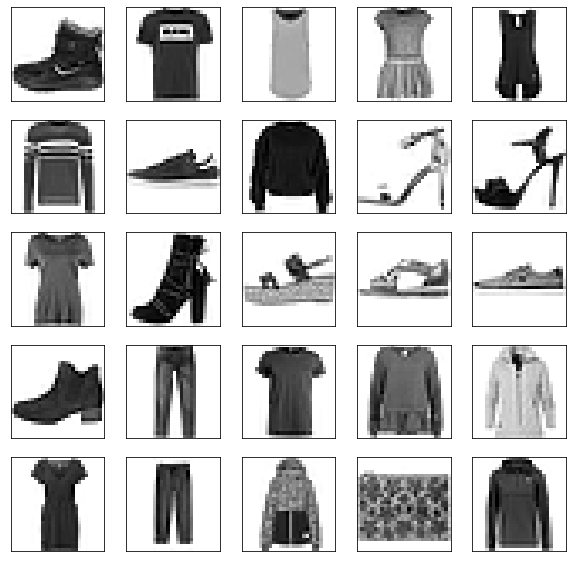

In [ ]:
# Plot image grid with labels
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1) # num_rows, num_cols, index
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]],color='white')
plt.show()

In [ ]:
model = tf.keras.Sequential([
    # creates a single input vector from the 28*28 matrix
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax')
])
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.fit(train_images, train_labels, epochs=10)

Train on 60000 samples
Epoch 1/10
60000/60000 [==============================] - 5s 91us/sample - loss: 3.1929 - accuracy: 0.6701
Epoch 2/10
60000/60000 [==============================] - 5s 85us/sample - loss: 0.7231 - accuracy: 0.7326
Epoch 3/10
60000/60000 [==============================] - 5s 86us/sample - loss: 0.6291 - accuracy: 0.7646
Epoch 4/10
60000/60000 [==============================] - 5s 85us/sample - loss: 0.5793 - accuracy: 0.7905
Epoch 5/10
60000/60000 [==============================] - 5s 83us/sample - loss: 0.5393 - accuracy: 0.8101
Epoch 6/10
60000/60000 [==============================] - 5s 86us/sample - loss: 0.5235 - accuracy: 0.8197
Epoch 7/10
60000/60000 [==============================] - 5s 86us/sample - loss: 0.5070 - accuracy: 0.8280
Epoch 8/10
60000/60000 [==============================] - 5s 85us/sample - loss: 0.4950 - accuracy: 0.8329
Epoch 9/10
60000/60000 [==============================] - 5s 86us/sample - loss: 0.4837 - accuracy: 0.8368
Epoch 10/10
60

In [ ]:
# Evaluate
test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)
print('\nTest accuracy:', test_acc)

10000/1 - 0s - loss: 0.3156 - accuracy: 0.8289

Test accuracy: 0.8289


In [ ]:
# Predict on all images
predictions = model.predict(test_images)
print(predictions[0])
print(np.argmax(predictions[0]))
print(test_labels[0])

[3.7434e-14 5.2313e-12 0.0000e+00 2.1829e-15 1.8335e-37 1.3280e-01
 2.7180e-27 6.4224e-02 3.6137e-16 8.0298e-01]
9
9


In [ ]:
# Predict on 1 image
img = test_images[1]
# Add the image to a batch where it's the only member.
img = (np.expand_dims(img,0))
predictions_single = model.predict(img)
np.argmax(predictions_single[0])

4

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  predictions_array, true_label, img = predictions_array, true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img, cmap=plt.cm.binary)

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)

def plot_value_array(i, predictions_array, true_label):
  predictions_array, true_label = predictions_array, true_label[i]
  plt.grid(False)
  plt.xticks(range(10))
  plt.yticks([])
  thisplot = plt.bar(range(10), predictions_array, color="#777777")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

def plot_pred_analysis(i, num_rows=1, num_cols=1, base_index=0,
                       test_images=test_images, test_labels=test_labels, predictions=predictions):
  plt.subplot(num_rows,2*num_cols,base_index+1)
  plot_image(i, predictions[i], test_labels, test_images)
  plt.subplot(num_rows,2*num_cols,base_index+2)
  plot_value_array(i, predictions[i],  test_labels)
  return(plt)

def plot_pred_analysis_grid(num_rows=5, num_cols=3,
                            test_images=test_images, test_labels=test_labels,
                            predictions=predictions):
  # Plot the first X test images, their predicted labels, and the true labels.
  # Color correct predictions in blue and incorrect predictions in red.
  num_images = num_rows*num_cols
  plt.figure(figsize=(2*2*num_cols, 2*num_rows))
  for i in range(num_images):
    plot_pred_analysis(i, num_rows, num_cols, base_index=2*i,
                       test_images=test_images, test_labels=test_labels,
                       predictions=predictions)
  plt.tight_layout()
  plt.show()


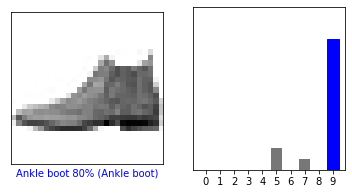

In [ ]:
plt.figure(figsize=(6,3))
plot_pred_analysis(0).show()

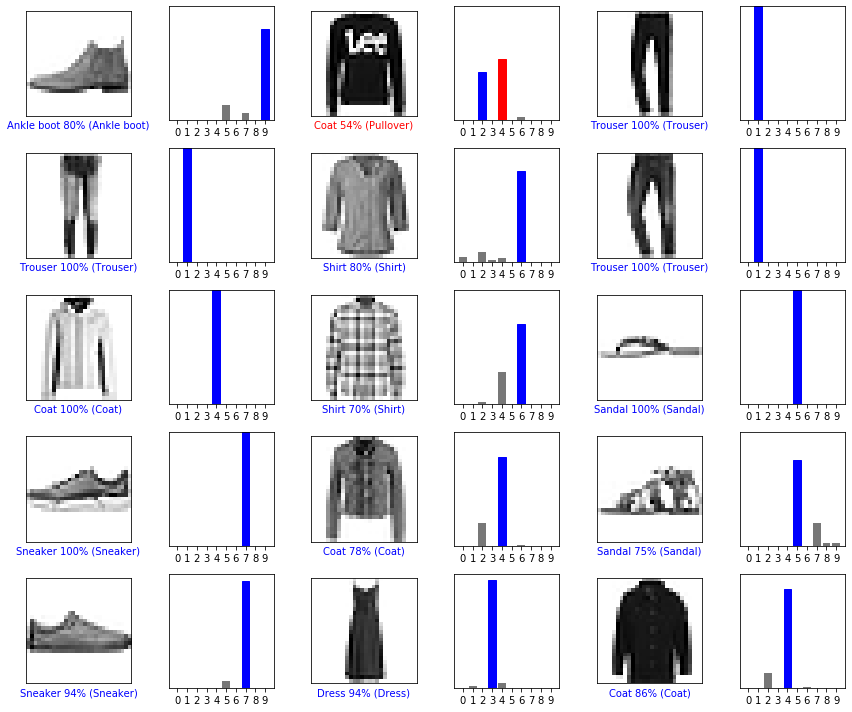

In [ ]:
plot_pred_analysis_grid(num_rows=5, num_cols=3)

# Data

## tf.data

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices([8, 3, 0, 8, 2, 1])
dataset

<TensorSliceDataset shapes: (), types: tf.int32>

In [ ]:
for elem in dataset:
  print(elem.numpy())

8
3
0
8
2
1


### Generators

In [ ]:
def count(stop):
  i = 0
  while i<stop:
    yield i
    i += 1

In [ ]:
for n in count(5):
  print(n)

0
1
2
3
4


In [ ]:
ds_counter = tf.data.Dataset.from_generator(count, args=[25], output_types=tf.int32, output_shapes = (), )
ds_counter

<DatasetV1Adapter shapes: (), types: tf.int32>

In [ ]:
for count_batch in ds_counter.repeat().batch(10).take(6):
  print(count_batch.numpy())

[0 1 2 3 4 5 6 7 8 9]
[10 11 12 13 14 15 16 17 18 19]
[20 21 22 23 24  0  1  2  3  4]
[ 5  6  7  8  9 10 11 12 13 14]
[15 16 17 18 19 20 21 22 23 24]
[0 1 2 3 4 5 6 7 8 9]


### Consuming CSV via pandas.DataFrame

In [ ]:
titanic_file = tf.keras.utils.get_file("train.csv", "https://storage.googleapis.com/tf-datasets/titanic/train.csv")

In [ ]:
df = pd.read_csv(titanic_file, index_col=None)
df.head()

,survived,sex,age,n_siblings_spouses,parch,fare,class,deck,embark_town,alone
0,0,male,22.0,1,0,7.2500,Third,unknown,Southampton,n
1,1,female,38.0,1,0,71.2833,First,C,Cherbourg,n
2,1,female,26.0,0,0,7.9250,Third,unknown,Southampton,y
3,1,female,35.0,1,0,53.1000,First,C,Southampton,n
4,0,male,28.0,0,0,8.4583,Third,unknown,Queenstown,y


In [ ]:
titanic_slices = tf.data.Dataset.from_tensor_slices(dict(df))
for feature_batch in titanic_slices.take(1):
  for key, value in feature_batch.items():
    print("  {!r:20s}: {}".format(key, value))

  'survived'          : 0
  'sex'               : b'male'
  'age'               : 22.0
  'n_siblings_spouses': 1
  'parch'             : 0
  'fare'              : 7.25
  'class'             : b'Third'
  'deck'              : b'unknown'
  'embark_town'       : b'Southampton'
  'alone'             : b'n'


### Consuming CSV scalably with disk access

In [ ]:
titanic_batches = tf.data.experimental.make_csv_dataset(
    titanic_file, batch_size=4,
    label_name="survived")

Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_determinstic`.
Instructions for updating:
Use `tf.data.Dataset.shuffle(buffer_size, seed)` followed by `tf.data.Dataset.repeat(count)`. Static tf.data optimizations will take care of using the fused implementation.


In [ ]:
for feature_batch, label_batch in titanic_batches.take(1):
  print("'survived': {}".format(label_batch))
  print("features:")
  for key, value in feature_batch.items():
    print("  {!r:20s}: {}".format(key, value))

'survived': [1 1 0 0]
features:
  'sex'               : [b'male' b'male' b'male' b'male']
  'age'               : [32. 51. 32. 46.]
  'n_siblings_spouses': [0 0 0 0]
  'parch'             : [0 0 0 0]
  'fare'              : [ 8.05  26.55   7.925 26.   ]
  'class'             : [b'Third' b'First' b'Third' b'Second']
  'deck'              : [b'E' b'E' b'unknown' b'unknown']
  'embark_town'       : [b'Southampton' b'Southampton' b'Southampton' b'Southampton']
  'alone'             : [b'y' b'y' b'y' b'y']


### Keras with Datasets

In [ ]:
train, test = tf.keras.datasets.fashion_mnist.load_data()
images, labels = train
images = images/255.0
labels = labels.astype(np.int32)

4423680/4422102 [==============================] - 0s 0us/step


In [ ]:
fmnist_train_ds = tf.data.Dataset.from_tensor_slices((images, labels))
fmnist_train_ds = fmnist_train_ds.shuffle(5000).batch(32)

In [ ]:
model = tf.keras.Sequential([
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(10, activation='softmax')
])
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
              metrics=['accuracy'])

In [ ]:
model.fit(fmnist_train_ds.repeat(), epochs=2, steps_per_epoch=20)

Train for 20 steps
Epoch 1/2
20/20 [==============================] - 0s 9ms/step - loss: 1.0807 - accuracy: 0.6547
Epoch 2/2
20/20 [==============================] - 0s 3ms/step - loss: 0.9706 - accuracy: 0.6766


In [ ]:
result = model.predict(fmnist_train_ds, steps = 10) # Predict on train?!
print(result.shape)

(320, 10)


### Estimators with Datasets

In [ ]:
# Input function (~generator)
def train_input_fn():
  titanic = tf.data.experimental.make_csv_dataset(
      titanic_file, batch_size=32,
      label_name="survived")
  titanic_batches = (
      titanic.cache().repeat().shuffle(500))
  return titanic_batches

In [ ]:
# Structured feature spec
embark = tf.feature_column.categorical_column_with_hash_bucket('embark_town', 32)
cls = tf.feature_column.categorical_column_with_vocabulary_list('class', ['First', 'Second', 'Third']) 
age = tf.feature_column.numeric_column('age')

In [ ]:
# Model (estimator) spec
import tempfile
model_dir = tempfile.mkdtemp()
model = tf.estimator.LinearClassifier(
    model_dir=model_dir,
    feature_columns=[embark, cls, age],
    n_classes=2
)

In [ ]:
model = model.train(input_fn=train_input_fn, steps=10)
# INFO:tensorflow:Saving checkpoints for 0 into /tmp/tmpgv5ftr0e/model.ckpt.
# INFO:tensorflow:loss = 0.6931472, step = 0
# INFO:tensorflow:Saving checkpoints for 10 into /tmp/tmpgv5ftr0e/model.ckpt.
# INFO:tensorflow:Loss for final step: 0.85767454.

In [ ]:
for pred in model.predict(train_input_fn):
  for key, value in pred.items():
    print(key, ":", value)
  break
# probabilities : [0.8015 0.1985]
# class_ids : [0]
# all_class_ids : [0 1]

## tf.io

# Portability

### Simple model setup

In [ ]:
# Simple feed forward fully connected model
model = tf.keras.Sequential()
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(20, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

# data
data = np.random.random((100, 32))
labels = np.random.random((100, 10))

# Model train
model.compile(optimizer=tf.keras.optimizers.Adam(0.01),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.fit(data, labels, epochs=10, batch_size=32)

Train on 100 samples
Epoch 1/10
100/100 [==============================] - 0s 4ms/sample - loss: 11.4073 - accuracy: 0.1700
Epoch 2/10
100/100 [==============================] - 0s 180us/sample - loss: 11.5832 - accuracy: 0.1100
Epoch 3/10
100/100 [==============================] - 0s 167us/sample - loss: 12.4917 - accuracy: 0.1100
Epoch 4/10
100/100 [==============================] - 0s 182us/sample - loss: 15.0183 - accuracy: 0.1000
Epoch 5/10
100/100 [==============================] - 0s 169us/sample - loss: 19.9996 - accuracy: 0.1000
Epoch 6/10
100/100 [==============================] - 0s 132us/sample - loss: 23.6681 - accuracy: 0.1000
Epoch 7/10
100/100 [==============================] - 0s 127us/sample - loss: 29.5378 - accuracy: 0.1200
Epoch 8/10
100/100 [==============================] - 0s 161us/sample - loss: 38.5548 - accuracy: 0.1100
Epoch 9/10
100/100 [==============================] - 0s 126us/sample - loss: 50.2711 - accuracy: 0.1500
Epoch 10/10
100/100 [===============

### Checkpoints

In [ ]:
checkpoint_dir = 'tmp_checkpoint_dir/'

In [ ]:
model.save_weights(checkpoint_dir)

In [ ]:
latest_checkpoint=tf.train.latest_checkpoint(".")

In [ ]:
latest_checkpoint

'./tmp_checkpoint_dir'

In [ ]:
!ls -l {latest_checkpoint}

total 4
-rw-r--r-- 1 root root 59 Nov 27 00:26 checkpoint


In [ ]:
model.load_weights(latest_checkpoint)

In [ ]:
# Create a callback that saves the model's weights every 5 epochs
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_dir,
    verbose=1,
    save_weights_only=True,
    period=5)

# Train the model with the new callback
model.fit(data, labels,
          epochs=5,
          callbacks=[cp_callback],
          verbose=0)


Epoch 00005: saving model to tmp_checkpoint_dir/


### SavedModel

In [ ]:
# Last path component is a version number
saved_model_dir = "/tmp/my_saved_model/1/"

In [ ]:
# Save model
tf.saved_model.save(model, saved_model_dir)

INFO:tensorflow:Assets written to: /tmp/my_saved_model/1/assets


In [ ]:
# Examine forward pass signature
!saved_model_cli show --dir {saved_model_dir} --tag_set serve --signature_def serving_default

The given SavedModel SignatureDef contains the following input(s):
  inputs['input_1'] tensor_info:
      dtype: DT_FLOAT
      shape: (-1, 32)
      name: serving_default_input_1:0
The given SavedModel SignatureDef contains the following output(s):
  outputs['output_1'] tensor_info:
      dtype: DT_FLOAT
      shape: (-1, 10)
      name: StatefulPartitionedCall:0
Method name is: tensorflow/serving/predict


In [ ]:
# Load model
loaded = tf.saved_model.load(saved_model_dir)

In [ ]:
# How does output look like?
infer = loaded.signatures["serving_default"]
print(infer.structured_outputs)

{'output_1': TensorSpec(shape=(None, 10), dtype=tf.float32, name='output_1')}


In [ ]:
# Inference
output_tensor_name = list(infer.structured_outputs.keys())[0]
formatted_input_data = tf.constant(tf.cast(data[0,tf.newaxis],tf.float32))
prediction = infer(formatted_input_data)[output_tensor_name]
prediction

<tf.Tensor: id=31503, shape=(1, 10), dtype=float32, numpy=
array([[4.3003e-15, 1.1573e-07, 4.3173e-16, 3.1181e-03, 2.1258e-01,
        2.3216e-02, 2.5192e-03, 5.1211e-01, 2.4557e-01, 8.8430e-04]],
      dtype=float32)>

#### Estimatore Saved Model

In [ ]:
# Feature column & Estimator spec
input_column = tf.feature_column.numeric_column("x")
estimator = tf.estimator.LinearClassifier(feature_columns=[input_column])

# Input function def
def input_fn():
  return tf.data.Dataset.from_tensor_slices(
    ({"x": [1., 2., 3., 4.]}, [1, 1, 0, 0])).repeat(200).shuffle(64).batch(16)

# Train
estimator.train(input_fn)

In [ ]:
# Serving function def based on input spec
serving_input_fn = tf.estimator.export.build_parsing_serving_input_receiver_fn(
  tf.feature_column.make_parse_example_spec([input_column]))
# Save model with serving function
export_path = estimator.export_saved_model(
  "/tmp/from_estimator/", serving_input_fn)

In [ ]:
# Load model
imported = tf.saved_model.load(export_path)

# Define prediction function using imported signatures and example prep
def predict(x):
  example = tf.train.Example()
  example.features.feature["x"].float_list.value.extend([x])
  return imported.signatures["predict"](
    examples=tf.constant([example.SerializeToString()]))

In [ ]:
print(predict(1.5))

{'probabilities': <tf.Tensor: id=47705, shape=(1, 2), dtype=float32, numpy=array([[0.4182, 0.5818]], dtype=float32)>, 'logits': <tf.Tensor: id=47704, shape=(1, 1), dtype=float32, numpy=array([[0.3302]], dtype=float32)>, 'class_ids': <tf.Tensor: id=47701, shape=(1, 1), dtype=int64, numpy=array([[1]])>, 'classes': <tf.Tensor: id=47702, shape=(1, 1), dtype=string, numpy=array([[b'1']], dtype=object)>, 'all_class_ids': <tf.Tensor: id=47699, shape=(1, 2), dtype=int32, numpy=array([[0, 1]], dtype=int32)>, 'logistic': <tf.Tensor: id=47703, shape=(1, 1), dtype=float32, numpy=array([[0.5818]], dtype=float32)>, 'all_classes': <tf.Tensor: id=47700, shape=(1, 2), dtype=string, numpy=array([[b'0', b'1']], dtype=object)>}


# Implementing a Fully Custom Model

### Components definition

In [ ]:
# Load the data
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()
# Scale image color values & add channel dimension
train_images = train_images / 255.0
train_images = train_images[..., tf.newaxis]
test_images = test_images / 255.0
test_images = test_images[..., tf.newaxis]
# Datset setup
train_ds = tf.data.Dataset.from_tensor_slices(
    (train_images, train_labels)).shuffle(10000).batch(32)
test_ds = tf.data.Dataset.from_tensor_slices((test_images, test_labels)).batch(32)

In [ ]:
# Model subclassing
class MyModel(tf.keras.Model):
  def __init__(self):
    super(MyModel, self).__init__()
    self.conv1 = layers.Conv2D(32, 3, activation='relu')
    self.flatten = layers.Flatten()
    self.d1 = layers.Dense(128, activation='relu')
    self.d2 = layers.Dense(10, activation='softmax')

  def call(self, x):
    x = self.conv1(x)
    x = self.flatten(x)
    x = self.d1(x)
    return self.d2(x)

# Create an instance of the model
model = MyModel()

In [ ]:
# Optimizer & loss setup
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam()

In [ ]:
# Metric Setup
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')
test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')

In [ ]:
@tf.function
def train_step(images, labels):
  # Predict and calculate loss
  with tf.GradientTape() as tape:
    predictions = model(images)
    loss = loss_object(labels, predictions)
  # Calculate gradient and update parameters using the optimizer algorithm
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))
  # Track metrics for current step
  train_loss(loss)
  train_accuracy(labels, predictions)

In [ ]:
@tf.function
def test_step(images, labels):
  predictions = model(images)
  t_loss = loss_object(labels, predictions)

  test_loss(t_loss)
  test_accuracy(labels, predictions)

### Training

In [ ]:
EPOCHS = 3

In [ ]:
# Train loop
for epoch in range(EPOCHS):
  # Train step
  for images, labels in train_ds:
    train_step(images, labels)
  # Test step
  for test_images, test_labels in test_ds:
    test_step(test_images, test_labels)

  # Print metrics for current step
  template = 'Epoch {}, Loss: {}, Accuracy: {}, Test Loss: {}, Test Accuracy: {}'
  print(template.format(epoch+1,
                        train_loss.result(),
                        train_accuracy.result()*100,
                        test_loss.result(),
                        test_accuracy.result()*100))

  # Reset the metrics for the next epoch
  train_loss.reset_states()
  train_accuracy.reset_states()
  test_loss.reset_states()
  test_accuracy.reset_states()


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

Epoch 1, Loss: 0.3773665130138397, Accuracy: 86.44833374023438, Test Loss: 0.31275439262390137, Test Accuracy: 88.4000015258789
Epoch 2, Loss: 0.246121346950531, Accuracy: 91.00999450683594, Test Loss: 0.28073614835739136, Test Accuracy: 89.77000427246094
Epoch 3, Loss: 0.1916118711233139, Accuracy: 92.9383316040039, Test Loss: 0.2761405110359192, Test Accuracy: 90.33000183105469


In [ ]:
# Display the model's architecture
model.summary()

Model: "my_model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            multiple                  320       
_________________________________________________________________
flatten_3 (Flatten)          multiple                  0         
_________________________________________________________________
dense_21 (Dense)             multiple                  2769024   
_________________________________________________________________
dense_22 (Dense)             multiple                  1290      
Total params: 2,770,634
Trainable params: 2,770,634
Non-trainable params: 0
_________________________________________________________________


### Saving

In [ ]:
# Save model
tf.saved_model.save(model, "/tmp/module_no_signatures")
# Load
imported = tf.saved_model.load("/tmp/module_no_signatures")


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

INFO:tensorflow:Assets written to: /tmp/module_no_signatures/assets


# Ecosystem

## Hub 1

In [ ]:
# Load model  
module_url = "https://tfhub.dev/google/nnlm-en-dim128/2"
embed = hub.load(module_url)
# Use model
embeddings = embed(["A long sentence."])
print(embeddings.shape)
print(embeddings[0,1:10])

(1, 128)
tf.Tensor([ 0.008  -0.0846  0.096   0.0084 -0.2037  0.0891  0.0699 -0.0195  0.0203], shape=(9,), dtype=float32)


In [ ]:
# Define keras layer from hub
hub_layer = hub.KerasLayer(module_url, output_shape=[50], input_shape=[], dtype=tf.string)
# Assembble model
model = tf.keras.Sequential()
model.add(hub_layer)
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

## Hub 2

In [ ]:
# Setup hub classifier
classifier_url ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/2"
IMAGE_SHAPE = (224, 224)
classifier = tf.keras.Sequential([
    hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))
])

In [ ]:
# Get sample data
labels_path = tf.keras.utils.get_file('ImageNetLabels.txt','https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')
imagenet_labels = np.array(open(labels_path).read().splitlines())
grace_hopper = tf.keras.utils.get_file('image.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/grace_hopper.jpg')
grace_hopper = Image.open(grace_hopper).resize(IMAGE_SHAPE)
grace_hopper = np.array(grace_hopper)/255.0

In [ ]:
# Predict imagenet class
result = classifier.predict(grace_hopper[np.newaxis, ...])
predicted_class = np.argmax(result[0], axis=-1)

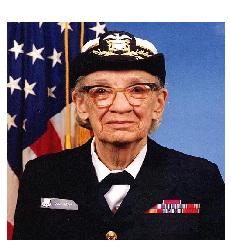

In [ ]:
# Show prediction
plt.imshow(grace_hopper)
plt.axis('off')
predicted_class_name = imagenet_labels[predicted_class]
_ = plt.title("Prediction: " + predicted_class_name.title(), color="white")

## Transfer

In [ ]:
# Load new data
data_root = tf.keras.utils.get_file(
  'flower_photos','https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz',
   untar=True)
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)
image_data = image_generator.flow_from_directory(str(data_root), target_size=IMAGE_SHAPE)

Found 3670 images belonging to 5 classes.


In [ ]:
# Use old classifier
for image_batch, label_batch in image_data:
  break
result_batch = classifier.predict(image_batch)
predicted_class_names = imagenet_labels[np.argmax(result_batch, axis=-1)]

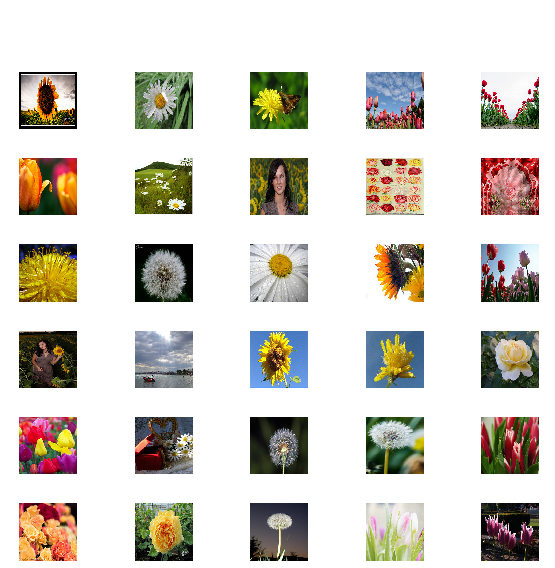

In [ ]:
# Examine predictions
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)
for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch[n])
  plt.title(predicted_class_names[n], color="white")
  plt.axis('off')
_ = plt.suptitle("ImageNet predictions", color="white")

In [ ]:
# Download headless model
feature_extractor_url = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/2"
# Setup layer
feature_extractor_layer = hub.KerasLayer(feature_extractor_url,
                                         input_shape=(224,224,3))
# Freeze pretrained
feature_extractor_layer.trainable = False
# Attach new head
model = tf.keras.Sequential([
  feature_extractor_layer,
  layers.Dense(image_data.num_classes, activation='softmax')
])

model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_9 (KerasLayer)   (None, 1280)              2257984   
_________________________________________________________________
dense_2 (Dense)              (None, 5)                 6405      
Total params: 2,264,389
Trainable params: 6,405
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
# Train new model
model.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss='categorical_crossentropy',
  metrics=['acc'])
steps_per_epoch = np.ceil(image_data.samples/image_data.batch_size)
model.fit_generator(image_data, epochs=2, steps_per_epoch=steps_per_epoch)

Epoch 1/2
115/115 [==============================] - 683s 6s/step - loss: 0.6798 - acc: 0.7537
Epoch 2/2
115/115 [==============================] - 665s 6s/step - loss: 0.3382 - acc: 0.8880


In [ ]:
# Load our class names
class_names = sorted(image_data.class_indices.items(), key=lambda pair:pair[1])
class_names = np.array([key.title() for key, value in class_names])
# Predict using new model
predicted_batch = model.predict(image_batch)
predicted_id = np.argmax(predicted_batch, axis=-1)
predicted_label_batch = class_names[predicted_id]
label_id = np.argmax(label_batch, axis=-1)

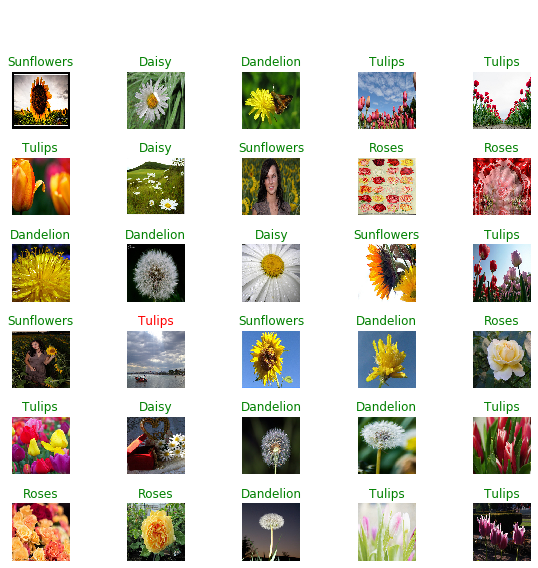

In [ ]:
# Examine predictions
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)
for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch[n])
  color = "green" if predicted_id[n] == label_id[n] else "red"
  plt.title(predicted_label_batch[n].title(), color=color)
  plt.axis('off')
_ = plt.suptitle("Model predictions (green: correct, red: incorrect)", color="white")

## Addons

In [ ]:
!pip install tensorflow-addons

In [ ]:
import tensorflow_addons as tfa

In [ ]:
# TFA layers and activations
model = tf.keras.Sequential([
  tf.keras.layers.Conv2D(filters=10, kernel_size=(3,3),
                         activation=tfa.activations.gelu),
  tfa.layers.GroupNormalization(groups=5, axis=3),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(10, activation='softmax')
])

# TFA optimizers, losses and metrics
model.compile(
    optimizer=tfa.optimizers.RectifiedAdam(0.001),
    loss=tfa.losses.TripletSemiHardLoss(),
    metrics=[tfa.metrics.MultiLabelConfusionMatrix(num_classes=10)])


## TesnorBoard

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
# Setup logging dir
logging_dir = "./logs/"
model_logging_dir = logging_dir + "fit/"
# Create logir for current trained model - time based for easy separation
def setup_model_logdir(root_logging_dir):
  return root_logging_dir + datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
# Clear any logs from previous runs
!rm -rf {logging_dir}

In [ ]:
# Simple MNIST model
mnist = tf.keras.datasets.mnist

(x_train, y_train),(x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(512, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
  ])

model.compile(optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

In [ ]:
# Setup tesnorboard callback
cur_log_dir=setup_model_logdir(model_logging_dir)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=cur_log_dir, histogram_freq=1)
# Train with tensorboard logging
model.fit(x=x_train, 
          y=y_train, 
          epochs=5, 
          validation_data=(x_test, y_test), 
          callbacks=[tensorboard_callback])

Train on 60000 samples, validate on 10000 samples
Epoch 1/5
60000/60000 [==============================] - 10s 169us/sample - loss: 0.2204 - accuracy: 0.9352 - val_loss: 0.1255 - val_accuracy: 0.9602
Epoch 2/5
60000/60000 [==============================] - 10s 159us/sample - loss: 0.0971 - accuracy: 0.9705 - val_loss: 0.0796 - val_accuracy: 0.9751
Epoch 3/5
60000/60000 [==============================] - 10s 161us/sample - loss: 0.0689 - accuracy: 0.9786 - val_loss: 0.0684 - val_accuracy: 0.9796
Epoch 4/5
60000/60000 [==============================] - 10s 162us/sample - loss: 0.0537 - accuracy: 0.9825 - val_loss: 0.0700 - val_accuracy: 0.9781
Epoch 5/5
60000/60000 [==============================] - 10s 161us/sample - loss: 0.0442 - accuracy: 0.9853 - val_loss: 0.0618 - val_accuracy: 0.9805


In [ ]:
%tensorboard --logdir {model_logging_dir}